# Land use and land cover classification using Python

Pixel-by-pixel land use and land cover classification is the process of assigning specific labels or classes to each pixel in a remotely sensed image, indicating the type of land use or land cover present at that location. There are several approaches to performing this classification, including supervised and unsupervised techniques.

Supervised Techniques:
In supervised techniques, you need a labeled dataset, where each pixel in the image is assigned to a specific land use or land cover class. Labels can be obtained through field surveys, visual interpretation, or other remote sensing techniques. Supervised classification involves training a model based on this labeled data and then using the trained model to classify new pixels.

The most common supervised techniques include machine learning algorithms such as Random Forest, Support Vector Machines (SVM), Convolutional Neural Networks (CNN), and others. These algorithms use features extracted from the pixels, such as spectral values, textures, vegetation indices, and others, to perform classification.

Unsupervised Techniques:
In unsupervised techniques, there is no need for labeled data. Instead, the algorithm analyzes the patterns and structures in the data to group similar pixels into classes. The most common unsupervised techniques include clustering analysis, such as the K-means algorithm, or hierarchical clustering. These algorithms group pixels based on similar characteristics, such as spectral values, into groups or classes.

Regardless of the approach chosen, it is important to consider data quality, image preprocessing, relevant feature extraction, and adequate evaluation of model performance.

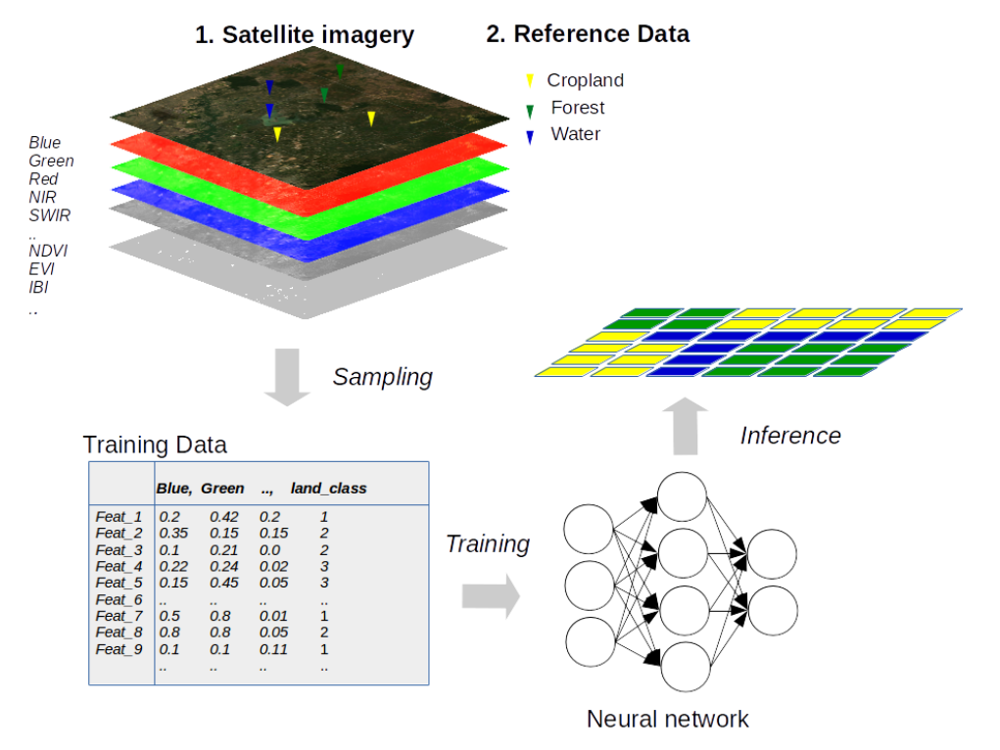

Supervised learning principle for remote sensing data.

- Each pixel is associated with features (e.g., spectral bands) and known Y labels.

- Knowledge about class membership is used in the feature space to train an algorithm.

- Define a decision boundary.

- Finally, unknown pixels are classified relative to the found decision boundary, and a classification map is provided.

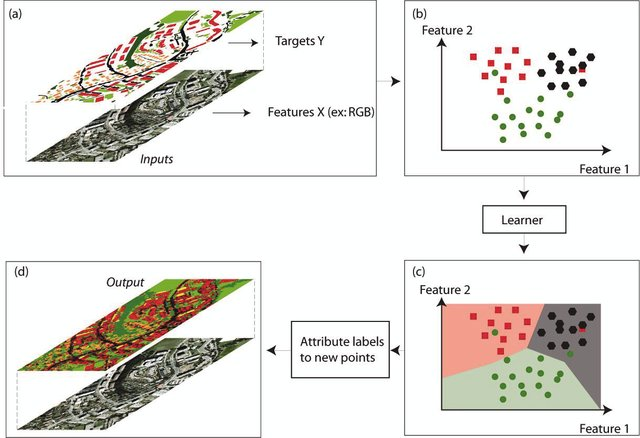

Link to dataset: https://drive.google.com/drive/folders/1mBg5uXwZHUi4sNzl1jzlJ5-fa070Y3dd?usp=sharing

Let's start by installing and importing the necessary libraries:

In [ ]:
!pip install rasterio

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21.3 MB 49.4 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 13.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.4/16.4 MB 56.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.9/7.9 MB 61.8 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import rasterio
from rasterio.plot import show
import xgboost as xgb
import numpy as np
from matplotlib import pyplot as plt
from matplotlib import cm
from matplotlib.colors import ListedColormap
import pandas as pd
import seaborn as sns
import geopandas as gpd

Now, let's import the image. First, we define the file path:

In [ ]:
path_img = '/content/drive/MyDrive/Datasets/LULC_Pixel_Classification/Imagem_sentinel2.tif'

Using Rasterio, we will open the file and read the source.

In [ ]:
src = rasterio.open(path_img)

In [ ]:
img = src.read()

In [ ]:
img

array([[[0.03265, 0.03265, 0.0306 , ..., 0.02685, 0.02165, 0.02165],
        [0.03295, 0.03295, 0.03295, ..., 0.02685, 0.02165, 0.02165],
        [0.03295, 0.03295, 0.03295, ..., 0.02685, 0.02165, 0.02165],
        ...,
        [0.02855, 0.02855, 0.02855, ..., 0.02625, 0.026  , 0.026  ],
        [0.0292 , 0.0292 , 0.0292 , ..., 0.026  , 0.0259 , 0.0259 ],
        [0.0292 , 0.0292 , 0.0292 , ..., 0.026  , 0.0259 , 0.0259 ]],

       [[0.0503 , 0.04455, 0.047  , ..., 0.0325 , 0.02885, 0.02395],
        [0.04455, 0.0431 , 0.04645, ..., 0.03515, 0.03185, 0.0227 ],
        [0.0446 , 0.04295, 0.04325, ..., 0.0341 , 0.03055, 0.022  ],
        ...,
        [0.0388 , 0.0405 , 0.04035, ..., 0.033  , 0.03345, 0.03345],
        [0.0394 , 0.0407 , 0.0409 , ..., 0.03275, 0.0331 , 0.0331 ],
        [0.0408 , 0.0404 , 0.04135, ..., 0.0335 , 0.03295, 0.0337 ]],

       [[0.07415, 0.06805, 0.07155, ..., 0.05545, 0.0485 , 0.0355 ],
        [0.0669 , 0.0638 , 0.0693 , ..., 0.0596 , 0.05375, 0.0334 ],
    

In [ ]:
img.shape

(12, 1380, 1329)

We saw that the shape of the array representing the image is in the order C x H x W, where C represents the number of channels or bands, H the number of rows, and W the number of columns. Most Python packages represent an image in the format H x W x C. So let's perform this transposition from the C axis to the end:

In [ ]:
img = img.transpose([1,2,0])

Then we will select the Red, Blue and Green channels so we can plot an RGB image of the study area:

In [ ]:
red = img[:,:,2]
green = img[:,:,1]
blue = img[:,:,0]

We concatenate the channels into a single array and plot it with matplotlib:

(-0.5, 1328.5, 1379.5, -0.5)

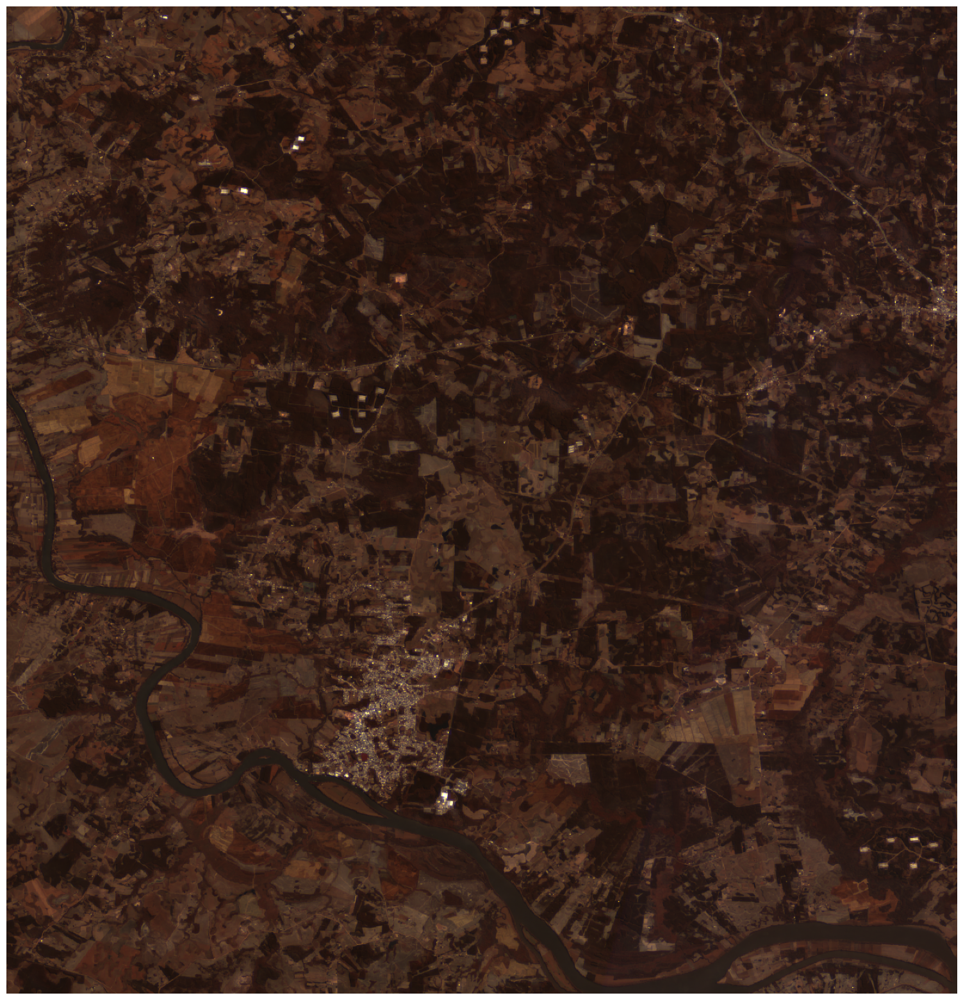

In [ ]:
rgb = np.dstack((red, green, blue))
plt.figure(figsize=[20,20])
plt.imshow(rgb*4)
plt.axis('off')

Now it's time to import the collected points with geopandas:

In [ ]:
samples = gpd.read_file('/content/drive/MyDrive/Datasets/LULC_Pixel_Classification/classes_de_uso.shp')

In [ ]:
samples

,B11,classe,B12,B8A,label,B1,B2,rand,B3,random,B4,B5,B6,B7,B8,B9,geometry
0,0.11060,3,0.04925,0.34265,agricultura,0.01640,0.02725,0.999976,0.05925,0.990412,0.03110,0.10555,0.25665,0.32045,0.32960,0.37570,POINT (-51.90767 -29.70724)
1,0.12030,3,0.05790,0.29270,agricultura,0.01665,0.02035,0.999933,0.03345,0.054960,0.02090,0.05785,0.19675,0.27700,0.21795,0.35335,POINT (-51.96534 -29.61651)
2,0.14800,3,0.07730,0.37535,agricultura,0.02515,0.04140,0.999918,0.08090,0.610448,0.06920,0.15110,0.27670,0.33200,0.32470,0.36825,POINT (-51.91476 -29.72386)
3,0.16370,3,0.10150,0.34395,agricultura,0.02620,0.04200,0.999899,0.08415,0.009023,0.07935,0.15470,0.26035,0.31145,0.33460,0.31360,POINT (-51.91099 -29.71236)
4,0.12560,3,0.06400,0.35155,agricultura,0.02160,0.03355,0.999895,0.06595,0.347600,0.04990,0.12265,0.26420,0.31950,0.31360,0.35290,POINT (-51.90767 -29.71272)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,0.34995,2,0.27430,0.25040,solo_exposto,0.05200,0.05640,0.954984,0.07990,0.986132,0.09175,0.13375,0.18910,0.21780,0.22310,0.26125,POINT (-51.93111 -29.71227)
4996,0.33655,2,0.24140,0.26275,solo_exposto,0.05255,0.07705,0.954976,0.10610,0.858527,0.14510,0.17850,0.19920,0.22540,0.23440,0.26600,POINT (-51.77894 -29.79348)
4997,0.35550,2,0.30085,0.28730,solo_exposto,0.05565,0.05985,0.954880,0.08320,0.503585,0.10155,0.17590,0.23170,0.25520,0.23840,0.28280,POINT (-51.77957 -29.78935)
4998,0.32695,2,0.20510,0.26720,solo_exposto,0.04175,0.05025,0.954838,0.07265,0.280611,0.07485,0.12135,0.20115,0.23260,0.23200,0.26075,POINT (-51.77948 -29.79150)


Before sampling the image with the collected points, we must check if the crs have the same values:

In [ ]:
samples = samples.to_crs('EPSG:4326')

In [ ]:
print(samples.crs)

EPSG:4326


In [ ]:
print(src.crs)

EPSG:4326


In [ ]:
cmap = ListedColormap(['pink','blue','red','yellow','green'])

<Axes: >

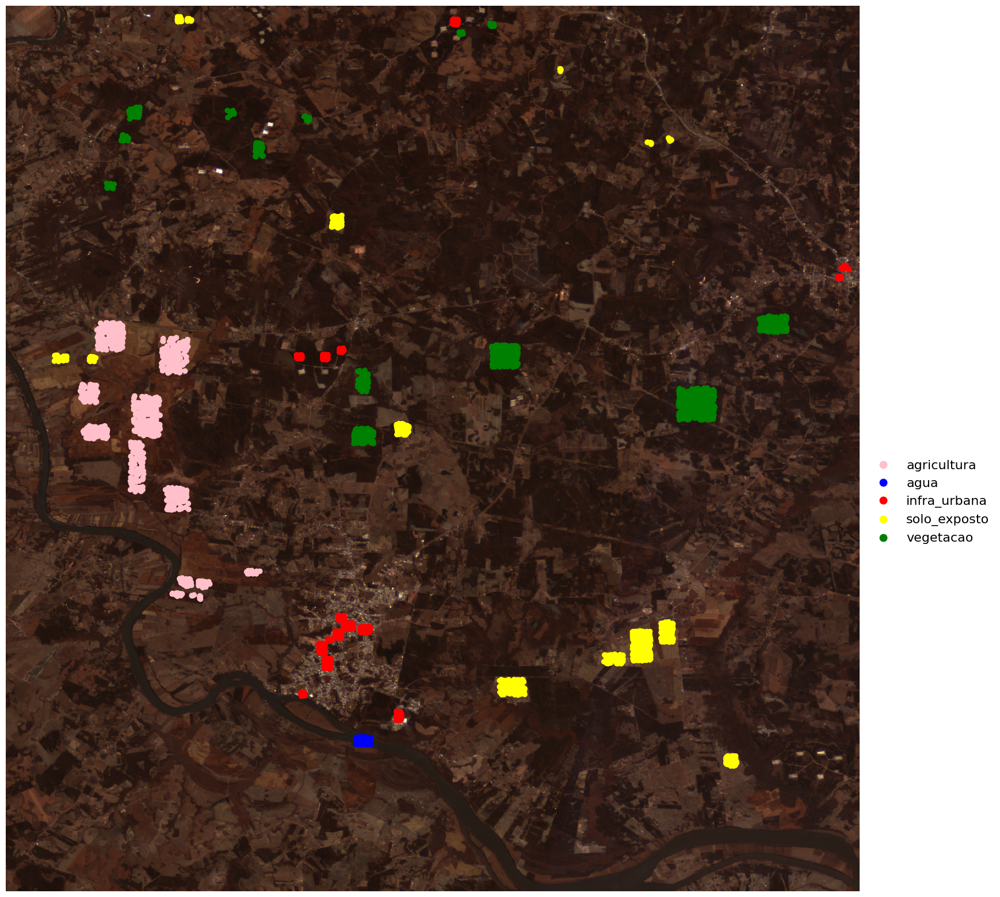

In [ ]:
cmap = ListedColormap(['pink','blue','red','yellow','green'])
fig, ax = plt.subplots(figsize=(20,20))
samples.plot(column='label', categorical=True, cmap=cmap, legend=True, legend_kwds={'bbox_to_anchor':(1, 0.5),'loc':'upper left','fontsize':16,'frameon':False}, ax=ax)
ax.axis('off')
show(rgb.transpose([2,0,1])*4, transform=src.transform, ax=ax)

So we will create a for loop for each point, selecting the corresponding pixel value for each spectral band:

In [ ]:
samples['geometry']

0       POINT (-51.90767 -29.70724)
1       POINT (-51.96534 -29.61651)
2       POINT (-51.91476 -29.72386)
3       POINT (-51.91099 -29.71236)
4       POINT (-51.90767 -29.71272)
                   ...             
4995    POINT (-51.93111 -29.71227)
4996    POINT (-51.77894 -29.79348)
4997    POINT (-51.77957 -29.78935)
4998    POINT (-51.77948 -29.79150)
4999    POINT (-51.81101 -29.80471)
Name: geometry, Length: 5000, dtype: geometry

In [ ]:
array_samples = []
for point in samples['geometry']:
  x = point.xy[0][0]
  y = point.xy[1][0]
  row, col = src.index(x,y)
  band_value = []
  for i in range(src.count):
    band_value.append(src.read(i+1)[row,col])
  array_samples.append(band_value)

At the end we convert the list to an array:

In [ ]:
X = np.array(array_samples)

This array will have the number of points X number of bands:

In [ ]:
X.shape

(5000, 12)

Let's now import some Sklearn functions that will be used in the classification:

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import cohen_kappa_score
from sklearn.metrics import confusion_matrix
from sklearn.preprocessing import LabelEncoder

We will call Y the target values defined in the collection by the user:

In [ ]:
samples['label']

0        agricultura
1        agricultura
2        agricultura
3        agricultura
4        agricultura
            ...     
4995    solo_exposto
4996    solo_exposto
4997    solo_exposto
4998    solo_exposto
4999    solo_exposto
Name: label, Length: 5000, dtype: object

In [ ]:
Y = samples['label'].values

In [ ]:
labelencoder = LabelEncoder()
Y = labelencoder.fit_transform(Y)

In [ ]:
Y

array([0, 0, 0, ..., 3, 3, 3])

First we will separate the data into training data and test data:

In [ ]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.3, random_state = 42)

Then we create the classifier instance:

In [ ]:
clf = xgb.XGBClassifier(objective="multi:softprob", random_state=42,verbosity=3,n_estimators=500,max_depth=10,nthread=8,n_jobs = 8, learning_rate=0.01)

and training:

In [ ]:
clf.fit(X_train,Y_train)

[18:04:52] INFO: /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 156 extra nodes, 0 pruned nodes, max_depth=10
[18:04:52] INFO: /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18 extra nodes, 0 pruned nodes, max_depth=6
[18:04:52] INFO: /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 82 extra nodes, 0 pruned nodes, max_depth=10
[18:04:52] INFO: /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 166 extra nodes, 0 pruned nodes, max_depth=10
[18:04:52] INFO: /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 110 extra nodes, 0 pruned nodes, max_depth=10
[18:04:52] INFO: /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 156 extra nodes, 0 pruned nodes, max_depth=10
[18:04:52] INFO: /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18 extra nodes, 0 pruned nodes, max_depth=6
[18:04:52] INFO: /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 82 

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.01, max_delta_step=0, max_depth=10,
              min_child_weight=1, missing=None, n_estimators=500, n_jobs=8,
              nthread=8, objective='multi:softprob', random_state=42,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=3)

After completing the training, we will check the accuracy of the classifier on the training data and the test data:

In [ ]:
print("Accuracy on training set: {:.2f}".format(clf.score(X_train, Y_train)))
print("Accuracy on test set: {:.2f}".format(clf.score(X_test, Y_test)))

Accuracy on training set: 1.00
Accuracy on test set: 0.93


We can also check other validation metrics. First, let's predict the test data:

In [ ]:
y_pred=clf.predict(X_test)

The Classification_report will show some metrics per predefined class of the test data:

In [ ]:
print(classification_report(Y_test, y_pred))

              precision    recall  f1-score   support

           0       0.93      0.84      0.88       316
           1       0.99      1.00      1.00       284
           2       0.98      0.96      0.97       301
           3       0.89      0.92      0.90       290
           4       0.87      0.94      0.90       309

    accuracy                           0.93      1500
   macro avg       0.93      0.93      0.93      1500
weighted avg       0.93      0.93      0.93      1500



Another very interesting metric is the confusion matrix:

In [ ]:
c_matrix = confusion_matrix(Y_test, y_pred)

In [ ]:
names = ['Agricultura','Agua', 'Infra_urbana','Solo','Vegetação']

Text(0.5, 50.09375, 'Predict')

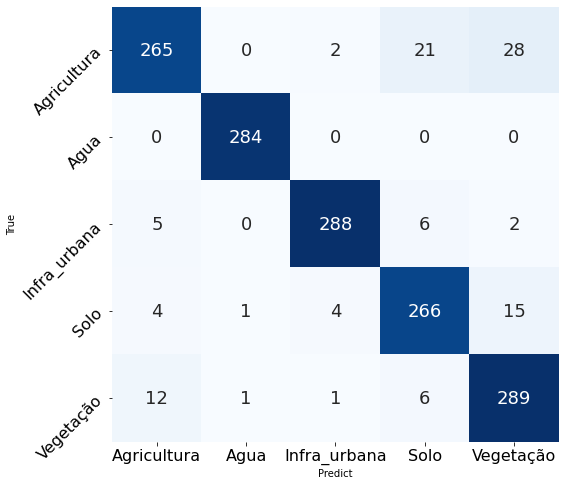

In [ ]:
r1 = pd.DataFrame(data=c_matrix, index= names, columns=names)
fig, ax = plt.subplots(figsize=(8,8))
ax = sns.heatmap(r1, annot=True, annot_kws={"size": 18},fmt='d',cmap="Blues", cbar = False)
#for t in ax.texts: t.set_text(t.get_text() + " %")
ax.tick_params(labelsize=16)
ax.set_yticklabels(names, rotation=45)
ax.set_ylabel('True')
ax.set_xlabel('Predict')

After checking the metrics, we will predict all the pixels in the image, resulting in the final usage and coverage map:

In [ ]:
Predict_img = np.nan_to_num(img)

In [ ]:
Predict_img.shape

(1834020, 10)

Here, we resize the image by vectorizing the row and column axes:

In [ ]:
Predict_img = Predict_img.reshape(img.shape[0]*img.shape[1],img.shape[2])

We perform the inference:

In [ ]:
array_pred=clf.predict(Predict_img)

We return to the prediction vector for the original image shape:

In [ ]:
array_pred = array_pred.reshape(img.shape[0],img.shape[1])

And we plot the result with matplotlib:

(-0.5, 1328.5, 1379.5, -0.5)

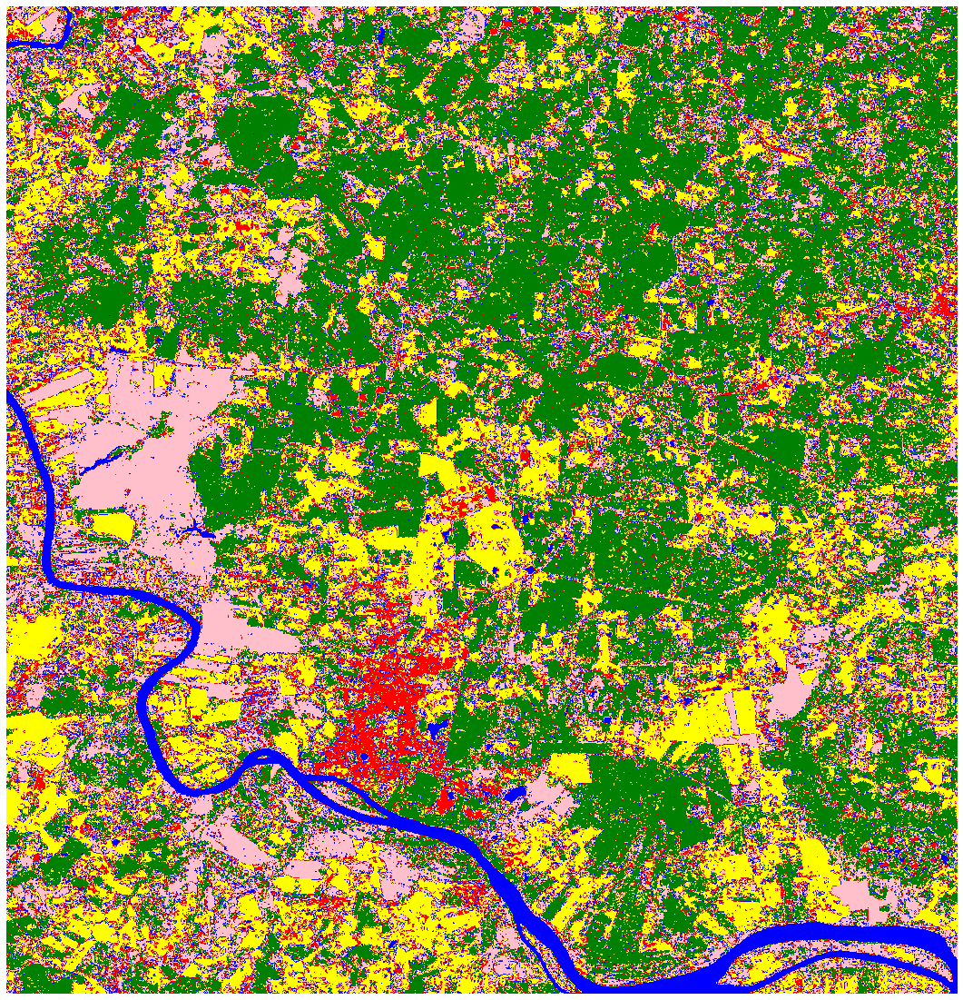

In [ ]:
plt.figure(figsize=[20,20])
plt.imshow(array_pred,cmap=cmap)
plt.axis('off')

Let's now calculate the area occupied by each class. First, we can see that each pixel is represented by a class value and a row and column position in the prediction array:

In [ ]:
array_pred

array([[3, 3, 2, ..., 4, 4, 0],
       [3, 3, 3, ..., 4, 0, 4],
       [3, 3, 3, ..., 4, 0, 4],
       ...,
       [0, 0, 0, ..., 1, 1, 1],
       [3, 0, 0, ..., 1, 1, 1],
       [0, 0, 0, ..., 1, 1, 1]])

Using the np.unique function, we will get the unique values of classes and the quantity per unique value that exists in this array.

In [ ]:
classes,quantidade =  np.unique(array_pred,return_counts=True)

In [ ]:
quantidade

array([438092,  54552, 166974, 408111, 766291])

From the number of pixels, we will calculate the area of each class basically, multiplying by 20x20 (Sentinel 2 Image pixel size) and by 1000000 (conversion from m² to km²).

In [ ]:
areas = quantidade*20*20/1000000

We added the class names:

In [ ]:
nomes = ['Agricultura', 'Agua','Infra Urbana', 'Solo', 'Vegetação']

And we stack it into an array:

In [ ]:
dados_stack = np.stack((classes,quantidade,areas,nomes))

Note that the lines represent each piece of information, but we want each type of information to be a column so we can plot it with matplotlib or seaborn:

In [ ]:
dados_stack

array([['0', '1', '2', '3', '4'],
       ['438092', '54552', '166974', '408111', '766291'],
       ['175.2368', '21.8208', '66.7896', '163.2444', '306.5164'],
       ['Agricultura', 'Agua', 'Infra Urbana', 'Solo', 'Vegetação']],
      dtype='<U32')

So we use axes transposition, transforming rows into columns and vice versa.

In [ ]:
dados_stack.T

array([['0', '438092', '175.2368', 'Agricultura'],
       ['1', '54552', '21.8208', 'Agua'],
       ['2', '166974', '66.7896', 'Infra Urbana'],
       ['3', '408111', '163.2444', 'Solo'],
       ['4', '766291', '306.5164', 'Vegetação']], dtype='<U32')

In [ ]:
dados_stack

array([['0', '1', '2', '3', '4'],
       ['438092', '54552', '166974', '408111', '766291'],
       ['175.2368', '21.8208', '66.7896', '163.2444', '306.5164'],
       ['Agricultura', 'Agua', 'Infra Urbana', 'Solo', 'Vegetação']],
      dtype='<U32')

This is how we convert the array into a DataFrame:

In [ ]:
df_dados = pd.DataFrame(data=dados_stack.T, columns=['Codigos', 'Qtd','Área km²', 'Classes'])

We convert the area values to floating point:

In [ ]:
df_dados['Área km²'] = df_dados['Área km²'].astype(np.float)

In [ ]:
df_dados

,Codigos,Qtd,Área km²,Classes
0,0,438092,175.2368,Agricultura
1,1,54552,21.8208,Agua
2,2,166974,66.7896,Infra Urbana
3,3,408111,163.2444,Solo
4,4,766291,306.5164,Vegetação


Let's plot a bar chart with the areas by class:

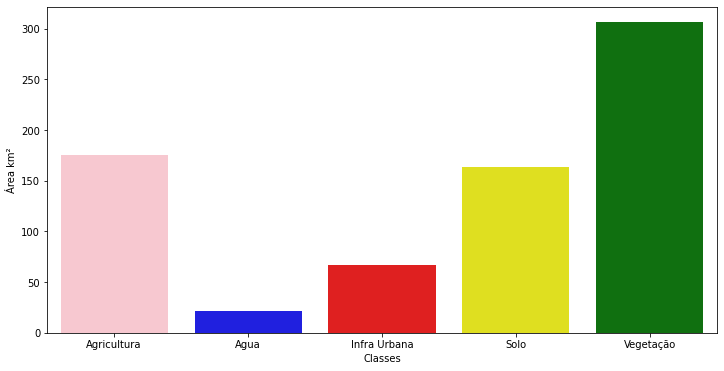

In [ ]:
fig, ax1 = plt.subplots(figsize=(12,6))
ax1 = sns.barplot(x= 'Classes',y="Área km²", data=df_dados, palette=cmap.colors)

Another way to represent this information is using the percentage of area for each class:

In [ ]:
percent = quantidade*100/quantidade.sum()

In [ ]:
percent

array([22.83982726,  2.73301273,  6.10342308, 26.87686067, 41.44687626])

We can use a Pie Chart to represent percentages:

In [ ]:
wp = { 'linewidth' : 0.2, 'edgecolor' : "black" }
explode = (0.0, 0.1, 0.0, 0.0, 0.0)

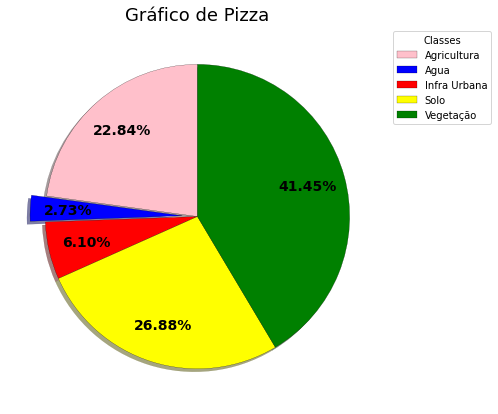

In [ ]:
fig, ax = plt.subplots(figsize =(10, 7))
wedges, texts, autotexts = ax.pie(percent,
                                  autopct = '%1.2f%%',
                                  shadow = True,
                                  explode = explode,
                                  colors = cmap.colors,
                                  pctdistance  = 0.75,
                                  startangle = 90,
                                  wedgeprops = wp)

# Adding legend
ax.legend(wedges, nomes,
          title ="Classes",
          loc ="upper left",
          bbox_to_anchor =(1, 0, 0.5, 1))

plt.setp(autotexts, size = 14, weight = 'bold')
ax.set_title("Gráfico de Pizza",fontsize=18)

# show plot
plt.show()

Finally, we will save the predicted map result in a raster file.

In [ ]:
export_image = array_pred[np.newaxis,:,:]

In [ ]:
array_pred.shape

(1380, 1329)

In [ ]:
export_image.shape

(1, 1380, 1329)

In [ ]:
out_meta = src.meta

In [ ]:
out_meta

{'count': 10,
 'crs': CRS.from_epsg(4326),
 'driver': 'GTiff',
 'dtype': 'float32',
 'height': 1380,
 'nodata': None,
 'transform': Affine(0.0001796630568239043, 0.0, -51.95496277233664,
       0.0, -0.0001796630568239043, -29.61404131934097),
 'width': 1329}

In [ ]:
out_meta.update({"driver": "GTiff",
                  "height": export_image.shape[1],
                  "width": export_image.shape[2],
                  "compress":'lzw',
                  "count":1
                  })

In [ ]:
with rasterio.open('/content/drive/MyDrive/Datasets/LULC_Pixel_Classification/LULC.tif', "w", **out_meta) as dest:
     dest.write(export_image)